# Import

In [1]:
import pandas as pd
from prophet import Prophet

# Init

# Playground

In [2]:
df = pd.read_csv(
    "https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv"
)
df.head()

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572


In [3]:
m = Prophet()
m.fit(df)

15:17:45 - cmdstanpy - INFO - Chain [1] start processing
15:17:46 - cmdstanpy - INFO - Chain [1] done processing


In [5]:
df.describe()

,y
count,2905.000000
mean,8.138958
std,0.845957
min,5.262690
25%,7.514800
50%,7.997999
75%,8.580168
max,12.846747


In [7]:
df.tail()

,ds,y
2900,2016-01-16,7.817223
2901,2016-01-17,9.273878
2902,2016-01-18,10.333775
2903,2016-01-19,9.125871
2904,2016-01-20,8.891374


In [6]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
3265,2017-01-15
3266,2017-01-16
3267,2017-01-17
3268,2017-01-18
3269,2017-01-19


In [10]:
future.describe()

,ds
count,3270
mean,2012-07-17 10:33:14.862385152
min,2007-12-10 00:00:00
25%,2010-04-17 06:00:00
50%,2012-07-24 12:00:00
75%,2014-10-22 18:00:00
max,2017-01-19 00:00:00


In [7]:
forecast = m.predict(future)
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail()

,ds,yhat,yhat_lower,yhat_upper
3265,2017-01-15,8.211654,7.529521,8.896704
3266,2017-01-16,8.536682,7.782102,9.245276
3267,2017-01-17,8.324099,7.626280,9.050615
3268,2017-01-18,8.156744,7.407182,8.895240
3269,2017-01-19,8.168699,7.490043,8.891212


/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


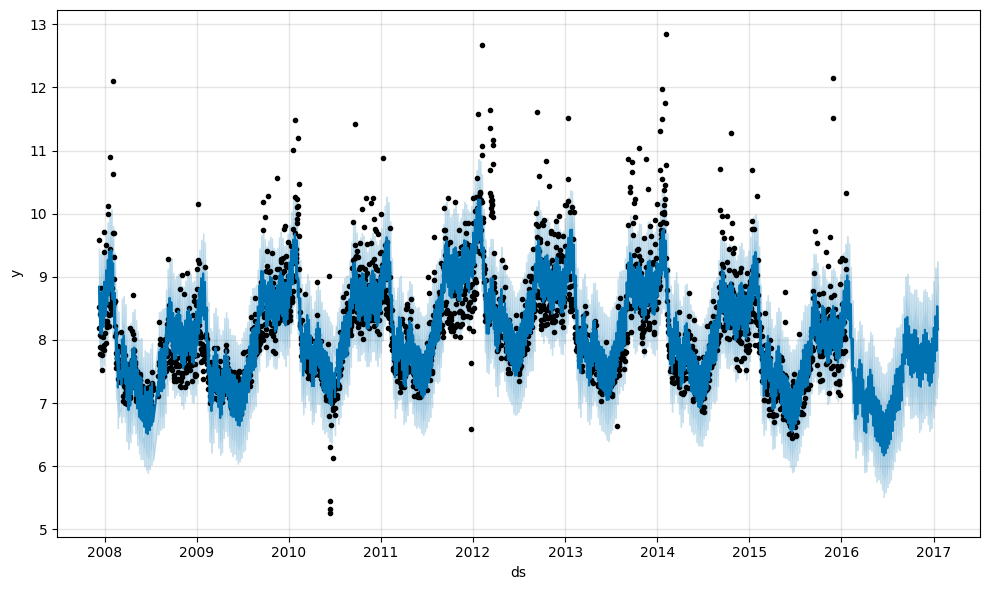

In [8]:
fig1 = m.plot(forecast)

/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will re

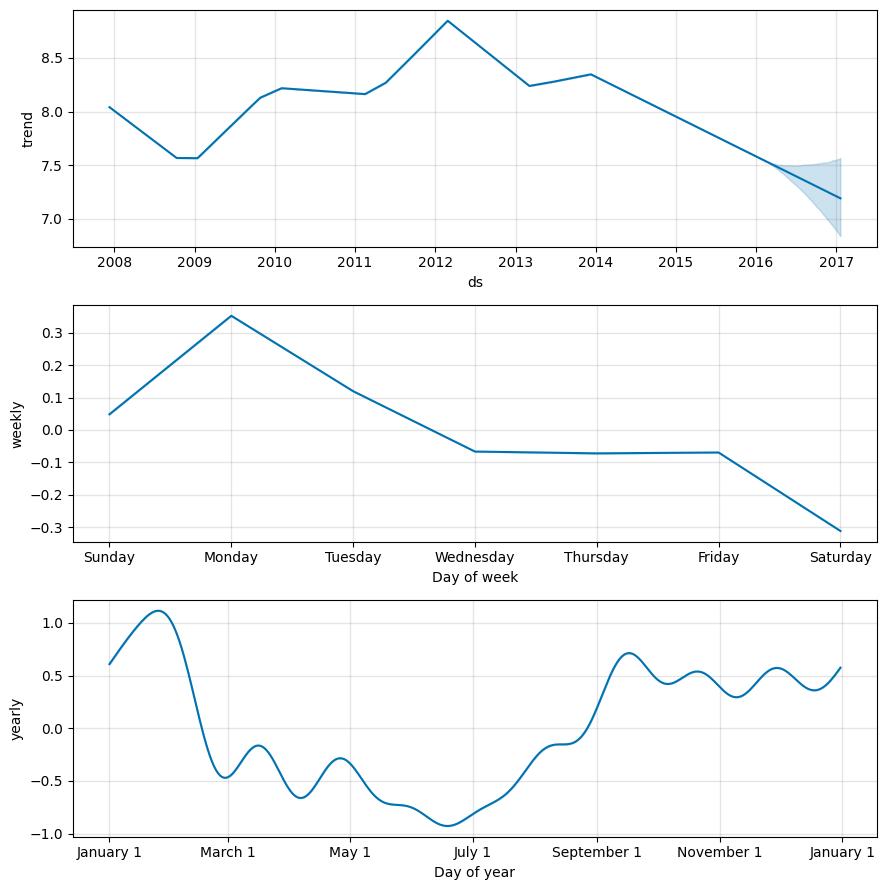

In [9]:
fig2 = m.plot_components(forecast)

In [10]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [11]:
plot_components_plotly(m, forecast)

# Hands on

## Import

In [2]:
import os
import sys
import logging
import multiprocessing
import pandas as pd
import numpy as np
import sqlalchemy
import exchange_calendars as xcals
from dotenv import load_dotenv

# import exchange_calendars as xcals
from datetime import datetime, timedelta

# import pytz
# import pandas as pd
# from IPython.display import display, HTML
from sqlalchemy import create_engine
from sqlalchemy.dialects.postgresql import insert, TEXT
from concurrent.futures import ThreadPoolExecutor
from functools import lru_cache

from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly, add_changepoints_to_plot

## Init

In [3]:
load_dotenv()  # take environment variables from .env.

module_path = os.getenv("LOCAL_AKSHARE_DEV_MODULE")
if module_path is not None and module_path not in sys.path:
    sys.path.insert(0, module_path)
import akshare as ak  # noqa: E402

print(ak.__version__)

DB_USER = os.getenv("DB_USER")
DB_PASSWORD = os.getenv("DB_PASSWORD")
DB_HOST = os.getenv("DB_HOST")
DB_PORT = os.getenv("DB_PORT")
DB_NAME = os.getenv("DB_NAME")

# Create an engine instance
alchemyEngine = create_engine(
    f"postgresql+psycopg2://{DB_USER}:{DB_PASSWORD}@{DB_HOST}:{DB_PORT}/{DB_NAME}",
    pool_recycle=3600,
)

logger = logging.getLogger(__name__)
logger.setLevel(logging.ERROR)

file_handler = logging.FileHandler("etl.log")
console_handler = logging.StreamHandler()

# Step 4: Create a formatter
formatter = logging.Formatter("%(name)s - %(levelname)s - %(message)s")

# Step 5: Attach the formatter to the handlers
file_handler.setFormatter(formatter)
console_handler.setFormatter(formatter)

# Step 6: Add the handlers to the logger
logger.addHandler(file_handler)
logger.addHandler(console_handler)

xshg = xcals.get_calendar("XSHG")

1.12.93


## Helper Functions

In [5]:
def predict(symbol, y_column) -> (Prophet, pd.DataFrame, pd.DataFrame): # type: ignore
    query = f"SELECT * FROM fund_etf_daily_em where symbol = '{symbol}' order by date"
    df = pd.read_sql(query, alchemyEngine, parse_dates=["date"])

    df = df.rename(
        columns={
            "date": "ds",
            y_column: "y",
        }
    )

    m = Prophet()  # Prophet object can only be fit once. Instantiate a new object.
    m.fit(df)

    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    
    return (m, df, forecast)

## Asset 1: Bond

### Trial 1 - Bond IR Spread

#### load data from table

In [5]:
# load all records from `bond_metrics_em` table into dataframe
query = "SELECT * FROM bond_metrics_em where china_yield_2y <> 'NaN'"
df = pd.read_sql(query, alchemyEngine, parse_dates=["date"])

# Display the first few rows of the dataframe
df.head()

,date,china_yield_2y,china_yield_5y,china_yield_10y,china_yield_30y,china_yield_spread_10y_2y,china_gdp_growth,us_yield_2y,us_yield_5y,us_yield_10y,us_yield_30y,us_yield_spread_10y_2y,us_gdp_growth,last_modified
0,2002-01-04,2.6563,2.8674,3.2096,4.4600,0.5533,NaN,3.19,4.50,5.18,5.57,1.99,NaN,2024-03-16 08:03:02.707151+00:00
1,2002-01-07,2.6697,2.8728,3.2003,4.3724,0.5306,NaN,3.08,4.39,5.09,5.49,2.01,NaN,2024-03-16 08:03:02.707151+00:00
2,2002-01-08,2.1578,2.7890,3.5225,2.4752,1.3647,NaN,3.07,4.39,5.10,5.51,2.03,NaN,2024-03-16 08:03:02.707151+00:00
3,2002-01-09,2.1627,2.8317,3.5896,2.1569,1.4269,NaN,3.03,4.38,5.10,5.51,2.07,NaN,2024-03-16 08:03:02.707151+00:00
4,2002-01-10,2.1559,2.8216,3.5784,2.1966,1.4225,NaN,2.94,4.27,5.00,5.42,2.06,NaN,2024-03-16 08:03:02.707151+00:00


In [14]:
df.describe()

,china_yield_2y,china_yield_5y,china_yield_10y,china_yield_30y,y,china_gdp_growth,us_yield_2y,us_yield_5y,us_yield_10y,us_yield_30y,us_yield_spread_10y_2y,us_gdp_growth
count,5547.000000,5547.000000,5547.000000,5547.000000,5547.000000,20.000000,5155.000000,5155.000000,5158.000000,4228.000000,5155.000000,15.000000
mean,2.691213,3.071884,3.427406,3.896808,0.736193,8.055000,1.876648,2.449439,3.053323,3.397774,1.177118,2.000000
std,0.642685,0.560503,0.578429,0.605731,0.464411,2.639074,1.538907,1.295186,1.160565,0.976265,0.967435,1.626565
min,0.796000,1.734200,1.977500,0.063700,-3.915200,2.200000,0.090000,0.190000,0.520000,0.990000,-1.080000,-2.800000
25%,2.236250,2.611150,2.990000,3.480350,0.414850,6.850000,0.550000,1.450000,2.110000,2.780000,0.290000,1.750000
50%,2.620500,2.996100,3.331600,3.922500,0.555000,8.150000,1.450000,2.260000,2.940000,3.180000,1.260000,2.500000
75%,3.144500,3.474650,3.740350,4.232400,1.012050,9.775000,2.850000,3.480000,4.070000,4.280000,1.990000,2.850000
max,8.127900,6.317000,5.412700,10.536600,2.516200,12.700000,5.290000,5.230000,5.440000,5.570000,2.900000,3.800000


#### transform DF to Prophet schema

In [12]:
df = df.rename(columns={
    "date": "ds",
    "china_yield_spread_10y_2y": "y",
})

#### fitting

In [13]:
m = Prophet()
m.fit(df)

16:01:03 - cmdstanpy - INFO - Chain [1] start processing
16:01:07 - cmdstanpy - INFO - Chain [1] done processing


#### predicting

In [16]:
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail()

,ds,yhat,yhat_lower,yhat_upper
5907,2025-03-11,0.403066,0.035383,0.785661
5908,2025-03-12,0.406153,0.016808,0.794848
5909,2025-03-13,0.406703,0.012036,0.772206
5910,2025-03-14,0.401649,0.022065,0.791586
5911,2025-03-15,0.398392,0.014411,0.757532


#### plotting

/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


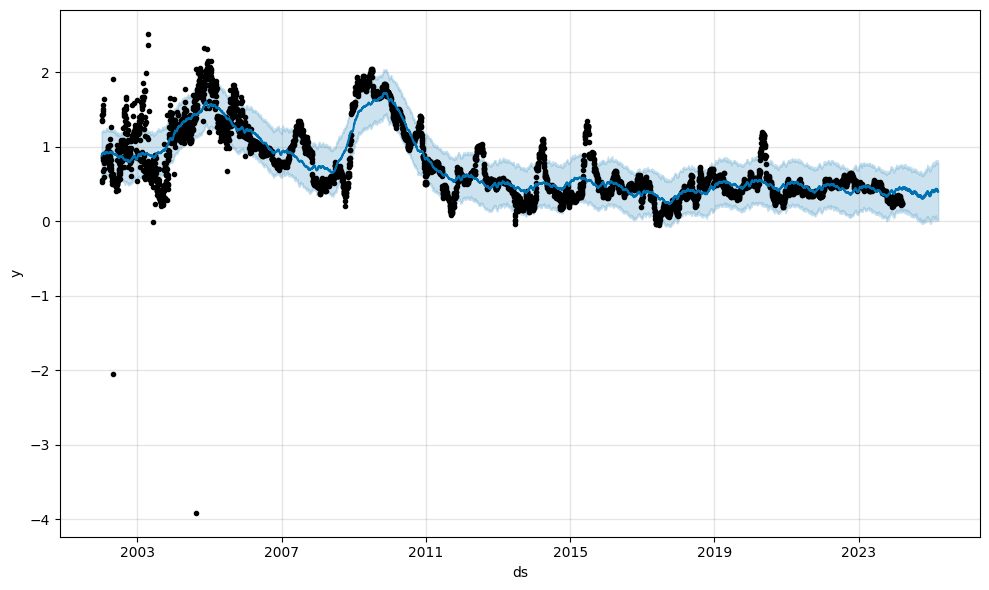

In [17]:
fig1 = m.plot(forecast)

/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will re

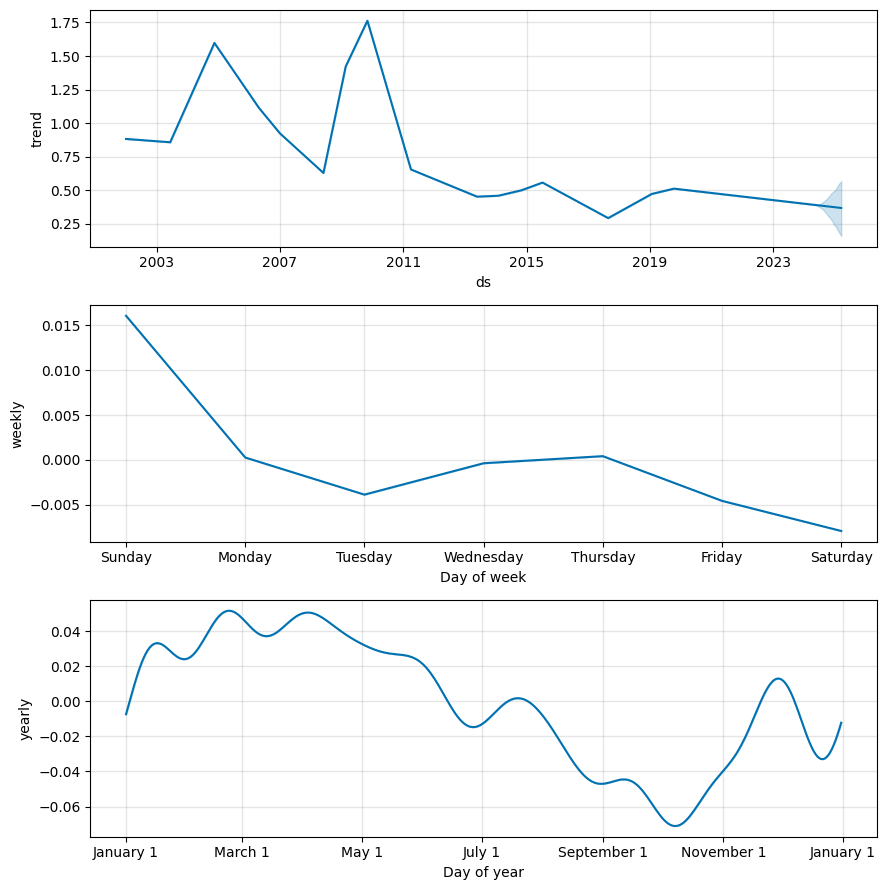

In [18]:
fig2 = m.plot_components(forecast)

In [19]:
plot_plotly(m, forecast)

In [20]:
plot_components_plotly(m, forecast)

### 城投债ETF 511220

In [49]:
symbol = "511220"
m, df, forecast = predict(symbol, "close")
df.describe()

18:25:32 - cmdstanpy - INFO - Chain [1] start processing


18:25:34 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,2243,2243.000000,2243.000000,2243.000000,2243.000000,2243.000000,2.243000e+03,2243.00000,2243.000000,2243.000000,2243.000000
mean,2019-08-02 02:43:04.039233024,8.188193,8.191125,8.203047,8.175114,38191.856442,4.831082e+07,0.36654,0.025484,0.001961,0.742390
min,2014-12-16 00:00:00,4.884000,5.593000,5.656000,4.884000,0.000000,1.942000e+03,0.00000,-2.000000,-0.143000,0.000000
25%,2017-04-15 12:00:00,7.175000,7.174500,7.192000,7.165500,179.000000,1.734816e+06,0.11000,-0.040000,-0.003000,0.000000
50%,2019-07-31 00:00:00,8.291000,8.288000,8.303000,8.274000,467.000000,4.501602e+06,0.22000,0.010000,0.001000,0.010000
75%,2021-11-22 12:00:00,9.179500,9.183000,9.189000,9.172500,1644.000000,1.557631e+07,0.42500,0.090000,0.008000,0.030000
max,2024-03-15 00:00:00,10.198000,10.198000,10.198000,10.195000,841079.000000,8.155571e+08,15.37000,2.250000,0.129000,16.360000
std,NaN,1.186978,1.183872,1.180797,1.190314,108370.072040,1.077555e+08,0.62216,0.283664,0.019869,2.107778


In [50]:
plot_plotly(m, forecast)

In [87]:
symbol = "511220"
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

21:41:41 - cmdstanpy - INFO - Chain [1] start processing
21:41:41 - cmdstanpy - INFO - Chain [1] done processing


### 30年国债ETF 511090

In [9]:
symbol = "511090"
m, df, forecast = predict(symbol, 'close')

17:38:15 - cmdstanpy - INFO - Chain [1] start processing
17:38:16 - cmdstanpy - INFO - Chain [1] done processing


/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


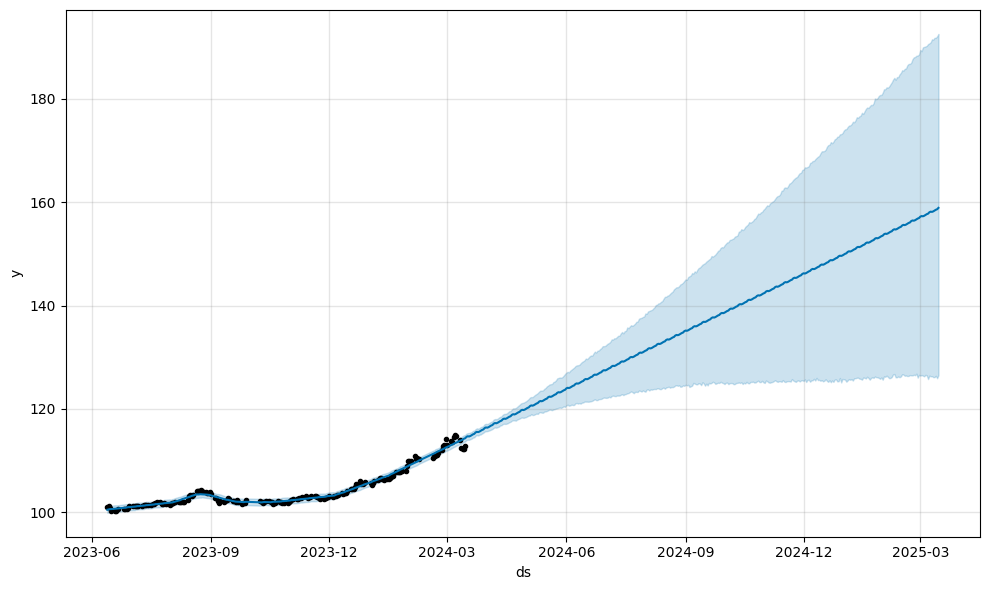

In [10]:
fig1 = m.plot(forecast)

/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/prophet/plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()


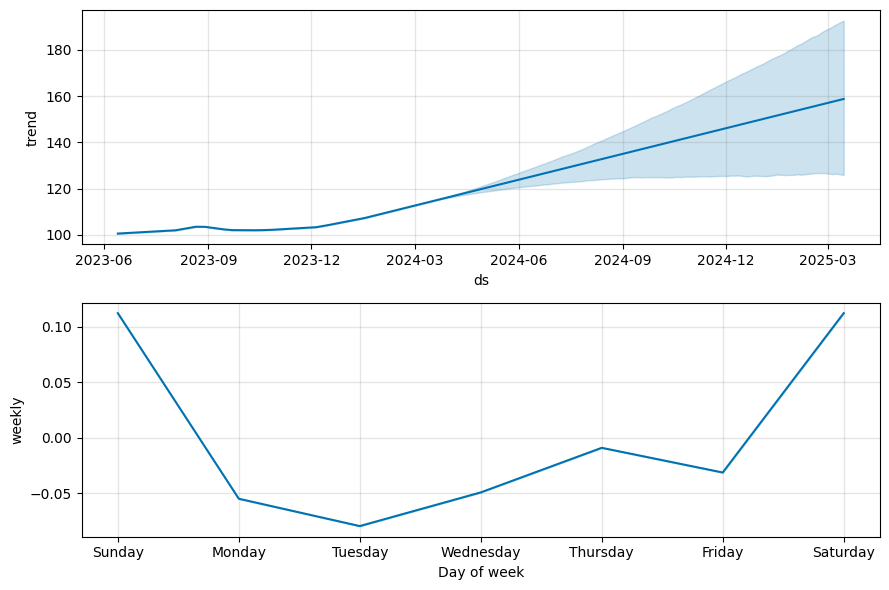

In [11]:
fig2 = m.plot_components(forecast)

## Asset 2: Domestic Stock

### 创业板50ETF 159949

In [71]:
symbol = "159949"
m, df, forecast = predict(symbol, "close")
df.describe()

18:55:09 - cmdstanpy - INFO - Chain [1] start processing


18:55:10 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,1858,1858.000000,1858.000000,1858.000000,1858.000000,1.858000e+03,1.858000e+03,1858.000000,1858.000000,1858.000000,1858.000000
mean,2020-05-17 10:47:55.349838592,0.891737,0.892085,0.902091,0.881584,6.468128e+06,5.829262e+08,2.267939,0.004365,-0.000100,2.794064
min,2016-07-22 00:00:00,0.421000,0.425000,0.433000,0.419000,7.441000e+03,6.782780e+05,0.000000,-8.160000,-0.074000,0.000000
25%,2018-06-20 06:00:00,0.681000,0.682000,0.687250,0.672250,3.455004e+06,2.300093e+08,1.450000,-1.000000,-0.008000,1.492500
50%,2020-05-19 12:00:00,0.826500,0.825500,0.837000,0.820000,6.206774e+06,5.345642e+08,2.010000,-0.110000,-0.001000,2.680000
75%,2022-04-17 06:00:00,1.088000,1.085000,1.100000,1.070000,8.709689e+06,8.376374e+08,2.780000,0.990000,0.008000,3.760000
max,2024-03-15 00:00:00,1.593000,1.585000,1.597000,1.565000,3.391140e+07,2.975649e+09,8.240000,8.330000,0.089000,14.650000
std,NaN,0.286918,0.287177,0.290713,0.282840,4.980397e+06,4.790447e+08,1.151729,1.774801,0.016633,2.151301


In [72]:
plot_plotly(m, forecast)

In [73]:
symbol = "159949"
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

18:55:37 - cmdstanpy - INFO - Chain [1] start processing
18:55:38 - cmdstanpy - INFO - Chain [1] done processing


### 红利低波50ETF 515450

In [58]:
symbol = "515450"
m, df, forecast = predict(symbol, "close")
df.describe()

18:36:55 - cmdstanpy - INFO - Chain [1] start processing


18:36:56 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,985,985.000000,985.000000,985.000000,985.000000,9.850000e+02,9.850000e+02,985.000000,985.000000,985.000000,985.000000
mean,2022-03-04 16:23:52.690355456,0.995664,0.996606,1.003632,0.988151,1.919206e+05,2.350085e+07,1.568934,0.063492,0.000568,1.516193
min,2020-02-26 00:00:00,0.668000,0.661000,0.670000,0.638000,1.970000e+03,2.048670e+05,0.000000,-5.800000,-0.057000,0.020000
25%,2021-03-02 00:00:00,0.898000,0.898000,0.909000,0.888000,1.084040e+05,1.126685e+07,0.950000,-0.590000,-0.006000,0.860000
50%,2022-03-07 00:00:00,0.987000,0.990000,0.998000,0.981000,1.988240e+05,2.415464e+07,1.320000,0.000000,0.000000,1.570000
75%,2023-03-10 00:00:00,1.109000,1.109000,1.120000,1.099000,2.420050e+05,2.994057e+07,1.950000,0.700000,0.007000,1.910000
max,2024-03-15 00:00:00,1.334000,1.334000,1.339000,1.324000,2.181967e+06,2.867586e+08,12.930000,9.070000,0.067000,17.240000
std,NaN,0.164382,0.163773,0.164460,0.163113,1.521415e+05,1.973284e+07,1.016059,1.152202,0.011139,1.201788


In [59]:
plot_plotly(m, forecast)

In [60]:
plot_components_plotly(m, forecast)

### 红利低波100ETF 515100

In [61]:
symbol = "515100"
m, df, forecast = predict(symbol, "close")
df.describe()

18:37:28 - cmdstanpy - INFO - Chain [1] start processing
18:37:28 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,899,899.000000,899.000000,899.000000,899.000000,8.990000e+02,8.990000e+02,899.000000,899.000000,899.000000,899.000000
mean,2022-05-08 06:29:13.948832,1.053323,1.054487,1.063041,1.044191,2.362453e+05,3.526214e+07,1.825217,0.092981,0.000781,0.401290
min,2020-07-03 00:00:00,0.613000,0.628000,0.633000,0.611000,1.033000e+03,1.367810e+05,0.000000,-6.770000,-0.071000,0.000000
25%,2021-06-05 12:00:00,0.898000,0.898000,0.902000,0.891000,5.241500e+04,7.153812e+06,1.030000,-0.665000,-0.007000,0.090000
50%,2022-05-12 00:00:00,1.072000,1.074000,1.082000,1.059000,1.030390e+05,1.556929e+07,1.490000,0.080000,0.001000,0.170000
75%,2023-04-11 12:00:00,1.242500,1.243500,1.254000,1.234000,1.791575e+05,2.959371e+07,2.185000,0.840000,0.009000,0.305000
max,2024-03-15 00:00:00,1.492000,1.424000,1.492000,1.417000,7.219443e+06,1.277551e+09,17.300000,11.620000,0.073000,12.260000
std,NaN,0.202312,0.202101,0.202877,0.201190,5.339395e+05,7.766460e+07,1.310846,1.377397,0.013827,0.906867


In [63]:
plot_plotly(m, forecast)

In [62]:
plot_components_plotly(m, forecast)

## Asset 3: Commodities

### 黄金ETF 518880

In [6]:
symbol = "518880"
m, df, forecast = predict(symbol, "close")
df.describe()

16:29:27 - cmdstanpy - INFO - Chain [1] start processing
16:29:30 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,2589,2589.000000,2589.000000,2589.000000,2589.000000,2.589000e+03,2.589000e+03,2589.000000,2589.000000,2589.000000,2589.000000
mean,2018-11-19 11:30:47.972189952,3.176211,3.176178,3.184456,3.167910,2.390545e+06,7.854985e+08,0.528687,0.027088,0.000867,8.114392
min,2013-07-29 00:00:00,2.168000,2.167000,2.178000,2.161000,4.052000e+03,1.047988e+06,0.000000,-6.210000,-0.264000,0.010000
25%,2016-03-24 00:00:00,2.632000,2.631000,2.640000,2.625000,7.051260e+05,2.127575e+08,0.290000,-0.390000,-0.012000,2.390000
50%,2018-11-16 00:00:00,2.819000,2.821000,2.828000,2.815000,2.062512e+06,7.023078e+08,0.420000,0.030000,0.001000,7.000000
75%,2021-07-16 00:00:00,3.766000,3.769000,3.774000,3.757000,3.527672e+06,1.171495e+09,0.610000,0.430000,0.013000,11.970000
max,2024-03-19 00:00:00,4.912000,4.899000,4.921000,4.894000,2.683145e+07,7.312325e+09,11.150000,5.570000,0.186000,91.080000
std,NaN,0.692988,0.692772,0.694089,0.691672,2.141222e+06,6.743960e+08,0.500745,0.802426,0.026094,7.268173


In [7]:
plot_plotly(m, forecast)

In [8]:
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

16:29:54 - cmdstanpy - INFO - Chain [1] start processing
16:29:54 - cmdstanpy - INFO - Chain [1] done processing
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/plotly/io/_json.py:560: UserWarning:

Discarding nonzero nanoseconds in conversion.



### 大宗商品ETF 510170

In [79]:
symbol = "510170"
m, df, forecast = predict(symbol, "close")
df.describe()

19:06:41 - cmdstanpy - INFO - Chain [1] start processing


19:06:44 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,3152,3152.000000,3152.000000,3152.000000,3152.000000,3.152000e+03,3.152000e+03,3152.000000,3152.000000,3152.000000,3152.000000
mean,2017-08-17 11:49:56.954314752,0.569853,0.570794,0.577084,0.562910,8.389622e+04,2.062907e+07,2.472970,0.023385,0.000055,3.832297
min,2011-01-25 00:00:00,0.313000,0.313000,0.316000,0.303000,1.000000e+00,8.900000e+01,0.000000,-10.020000,-0.061000,0.000000
25%,2014-04-29 18:00:00,0.415000,0.416000,0.420000,0.410000,5.035000e+02,8.646925e+04,1.297500,-0.880000,-0.005000,0.020000
50%,2017-08-05 12:00:00,0.512500,0.513000,0.519000,0.504500,1.291200e+04,1.547632e+06,1.950000,0.000000,0.000000,0.590000
75%,2020-12-11 18:00:00,0.735250,0.737250,0.747000,0.725000,5.114550e+04,1.116360e+07,3.000000,0.970000,0.005000,2.340000
max,2024-03-15 00:00:00,1.144000,1.137000,1.150000,1.086000,2.203136e+06,7.049915e+08,20.050000,10.060000,0.062000,100.640000
std,NaN,0.183928,0.183605,0.185876,0.181322,1.951455e+05,5.293678e+07,1.987157,1.804262,0.010575,8.914286


In [80]:
plot_plotly(m, forecast)

In [85]:
symbol = "510170"
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

21:36:35 - cmdstanpy - INFO - Chain [1] start processing
21:36:35 - cmdstanpy - INFO - Chain [1] done processing


### 能源ETF 159930

In [100]:
symbol = "159930"
m, df, forecast = predict(symbol, "close")
df.describe()

22:47:37 - cmdstanpy - INFO - Chain [1] start processing
22:47:39 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,2549,2549.000000,2549.000000,2549.000000,2549.000000,2.549000e+03,2.549000e+03,2549.000000,2549.000000,2549.000000,2549.000000
mean,2018-12-16 13:00:43.781875200,0.888569,0.890131,0.899824,0.878220,8.746752e+04,8.527591e+06,2.333288,0.031173,0.000177,4.060773
min,2013-09-16 00:00:00,0.555000,0.557000,0.562000,0.554000,2.600000e+01,2.082000e+03,0.000000,-10.040000,-0.123000,0.000000
25%,2016-05-05 00:00:00,0.741000,0.741000,0.748000,0.731000,2.266000e+03,1.799240e+05,1.280000,-0.780000,-0.006000,0.110000
50%,2018-12-13 00:00:00,0.831000,0.834000,0.839000,0.825000,1.181400e+04,1.100614e+06,1.880000,0.000000,0.000000,0.550000
75%,2021-07-29 00:00:00,1.028000,1.029000,1.053000,1.013000,1.444850e+05,1.338031e+07,2.820000,0.840000,0.007000,6.710000
max,2024-03-18 00:00:00,1.585000,1.586000,1.610000,1.560000,1.217108e+06,1.152649e+08,15.100000,10.050000,0.140000,56.510000
std,NaN,0.206117,0.207195,0.210870,0.201906,1.372023e+05,1.363250e+07,1.656966,1.804902,0.018197,6.369763


In [101]:
plot_plotly(m, forecast)

In [102]:
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

22:48:31 - cmdstanpy - INFO - Chain [1] start processing
22:48:32 - cmdstanpy - INFO - Chain [1] done processing


### 能源化工ETF 159981

In [9]:
symbol = "159981"
m, df, forecast = predict(symbol, "close")
df.describe()

18:00:54 - cmdstanpy - INFO - Chain [1] start processing
18:00:55 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,1009,1009.000000,1009.000000,1009.000000,1009.000000,1.009000e+03,1.009000e+03,1009.000000,1009.000000,1009.000000,1009.000000
mean,2022-02-17 16:24:44.241823744,1.346873,1.346134,1.357508,1.335699,1.444861e+05,2.190493e+07,1.578008,0.063221,0.000643,9.534044
min,2020-01-17 00:00:00,0.751000,0.747000,0.758000,0.745000,4.371000e+03,3.861900e+05,0.000000,-10.000000,-0.228000,0.290000
25%,2021-02-01 00:00:00,1.014000,1.013000,1.022000,1.003000,4.856300e+04,5.330683e+06,0.960000,-0.770000,-0.010000,3.200000
50%,2022-02-21 00:00:00,1.450000,1.450000,1.463000,1.439000,1.140980e+05,1.658353e+07,1.300000,0.120000,0.002000,7.530000
75%,2023-03-06 00:00:00,1.590000,1.591000,1.602000,1.580000,1.877980e+05,2.861186e+07,1.840000,0.940000,0.011000,12.390000
max,2024-03-19 00:00:00,2.130000,2.281000,2.311000,2.112000,1.714759e+06,3.274574e+08,11.390000,8.100000,0.169000,113.160000
std,NaN,0.311158,0.311338,0.315103,0.307502,1.469951e+05,2.643691e+07,1.079176,1.626128,0.025094,9.700141


In [10]:
plot_plotly(m, forecast)

In [11]:
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

18:01:13 - cmdstanpy - INFO - Chain [1] start processing
18:01:13 - cmdstanpy - INFO - Chain [1] done processing
/Users/jx/.pyenv/versions/3.12.2/envs/venv_3.12.2/lib/python3.12/site-packages/plotly/io/_json.py:560: UserWarning:

Discarding nonzero nanoseconds in conversion.



### 豆粕 159985

In [103]:
symbol = "159985"
m, df, forecast = predict(symbol, "close")
df.describe()

22:50:19 - cmdstanpy - INFO - Chain [1] start processing


22:50:20 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,1038,1038.000000,1038.000000,1038.000000,1038.000000,1.038000e+03,1.038000e+03,1038.000000,1038.000000,1038.000000,1038.000000
mean,2022-01-25 06:40:55.491329536,1.505396,1.505826,1.513420,1.497329,2.825454e+05,4.681088e+07,1.063353,0.083565,0.001119,4.654547
min,2019-12-05 00:00:00,0.908000,0.919000,0.922000,0.908000,2.669800e+04,3.430738e+06,0.000000,-5.600000,-0.089000,0.440000
25%,2020-12-29 06:00:00,1.165250,1.166250,1.170250,1.160250,1.349410e+05,1.715341e+07,0.700000,-0.647500,-0.009000,2.222500
50%,2022-01-22 12:00:00,1.345000,1.338500,1.352500,1.333000,2.220610e+05,3.140728e+07,0.950000,0.000000,0.000000,3.660000
75%,2023-02-21 18:00:00,1.847000,1.848500,1.857000,1.840250,3.437740e+05,5.554048e+07,1.270000,0.780000,0.011000,5.667500
max,2024-03-18 00:00:00,2.372000,2.372000,2.403000,2.364000,2.036275e+06,4.394144e+08,6.790000,8.890000,0.151000,33.560000
std,NaN,0.422015,0.422031,0.424285,0.419892,2.424635e+05,5.316584e+07,0.578830,1.306892,0.020313,3.980471


In [104]:
plot_plotly(m, forecast)

In [105]:
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

22:50:51 - cmdstanpy - INFO - Chain [1] start processing
22:50:51 - cmdstanpy - INFO - Chain [1] done processing


## Asset 4: Overseas

### 标普500ETF 513500

In [67]:
symbol = "513500"
m, df, forecast = predict(symbol, "close")
df.describe()

18:40:58 - cmdstanpy - INFO - Chain [1] start processing


18:41:00 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,2472,2472.000000,2472.000000,2472.000000,2472.000000,2.472000e+03,2.472000e+03,2472.000000,2472.000000,2472.000000,2472.000000
mean,2019-02-10 22:48:20.970873600,0.958635,0.958937,0.962411,0.954970,4.996862e+05,7.899618e+07,0.819555,0.057848,0.000519,0.731744
min,2014-01-15 00:00:00,0.482000,0.482000,0.484000,0.480000,1.001000e+03,1.384660e+05,0.000000,-8.800000,-0.081000,0.000000
25%,2016-07-26 18:00:00,0.690000,0.689750,0.693750,0.686500,1.397100e+04,1.959865e+06,0.380000,-0.430000,-0.004000,0.020000
50%,2019-02-12 12:00:00,0.899000,0.900000,0.905500,0.894500,1.557950e+05,3.360131e+07,0.570000,0.070000,0.001000,0.230000
75%,2021-08-23 06:00:00,1.266250,1.267000,1.270000,1.263000,7.316332e+05,1.245154e+08,0.890000,0.600000,0.006000,1.070000
max,2024-03-15 00:00:00,1.800000,1.800000,1.801000,1.791000,1.193308e+07,1.365433e+09,11.510000,5.660000,0.066000,17.480000
std,NaN,0.322390,0.322592,0.322936,0.322018,7.887035e+05,1.097710e+08,0.917448,1.088700,0.011120,1.155030


In [68]:
plot_plotly(m, forecast)

In [66]:
symbol = "513500"
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

### 日本东证指数ETF 513800

In [37]:
symbol = "513800"
m, df, forecast = predict(symbol, "close")
df.describe()

18:07:36 - cmdstanpy - INFO - Chain [1] start processing
18:07:37 - cmdstanpy - INFO - Chain [1] done processing


,ds,open,y,high,low,volume,turnover,amplitude,change_rate,change_amount,turnover_rate
count,1148,1148.000000,1148.000000,1148.000000,1148.000000,1.148000e+03,1.148000e+03,1148.000000,1148.000000,1148.000000,1148.000000
mean,2021-11-01 22:13:22.787456512,1.114826,1.114952,1.123395,1.106977,2.359138e+04,3.021623e+06,1.487927,0.035601,0.000355,0.444434
min,2019-06-25 00:00:00,0.848000,0.829000,0.850000,0.825000,2.000000e+00,2.290000e+02,0.000000,-5.340000,-0.056000,0.000000
25%,2020-08-25 18:00:00,1.044000,1.043750,1.054000,1.033750,3.300000e+02,3.691075e+04,0.650000,-0.510000,-0.006000,0.010000
50%,2021-11-03 12:00:00,1.105500,1.106000,1.112000,1.097000,1.427000e+03,1.512955e+05,1.060000,0.080000,0.001000,0.030000
75%,2023-01-05 06:00:00,1.178000,1.179000,1.185000,1.173000,9.089500e+03,9.564295e+05,1.730000,0.600000,0.007000,0.170000
max,2024-03-15 00:00:00,1.426000,1.432000,1.443000,1.425000,1.922658e+06,2.575840e+08,13.770000,4.870000,0.054000,36.230000
std,NaN,0.099902,0.099720,0.100040,0.100043,1.102530e+05,1.476482e+07,1.547619,1.050458,0.011433,2.077784


In [69]:
plot_plotly(m, forecast)

In [70]:
symbol = "513800"
m, df, forecast = predict(symbol, "change_rate")
plot_components_plotly(m, forecast)

18:50:09 - cmdstanpy - INFO - Chain [1] start processing
18:50:09 - cmdstanpy - INFO - Chain [1] done processing


# Output top-N TS component graph with highest Sortino Ratio

In [ ]:
top_n = 100
since_inception = "6 months"
query = f"""
    SELECT fundcode, fundname, sortinoratio sortino 
    FROM fund_etf_perf_em 
    where 
        sortinoratio is not null 
        and sortinoratio <> 'nan'
        and inceptiondate <= CURRENT_DATE - interval '{since_inception}'
    order by sortinoratio desc limit {top_n}
"""
df = pd.read_sql(query, alchemyEngine)

# Ensure the directory for saving images exists
output_dir = '/Users/jx/Downloads/ETF_forecast'
os.makedirs(output_dir, exist_ok=True)

for index, row in df.iterrows():
    fundcode = row['fundcode']
    fundname = row['fundname'].replace(' ', '_')  # Replace spaces with underscores for filename
    sortino = row['sortino']
    timestamp = datetime.now().strftime('%Y%m%d%H%M%S')

    # Predict and forecast 'close'
    m, df, forecast = predict(fundcode, 'close')
    fig1 = m.plot(forecast)
    fig1.savefig(f'{output_dir}/{fundcode}_{fundname}_{sortino}_forecast_{timestamp}.png')

    # Predict and forecast 'change_rate'
    m, df, forecast = predict(fundcode, 'change_rate')
    fig2 = m.plot_components(forecast)
    fig2.savefig(f'{output_dir}/{fundcode}_{fundname}_{sortino}_components_{timestamp}.png')